In [1]:
import zarr
import allel
import numpy as np
import pandas as pd
import h5py
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

/home/aliman/github/alimanfoo/ag1000g-phase2-data-paper/binder/deps/conda/envs/ag1000g-phase2-data-paper/lib/python3.6/site-packages/dask/config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [2]:
import seaborn as sns
sns.set_style('white')
sns.set_style('ticks')
sns.set_context('paper', font_scale=.6)
plt.rcParams['figure.dpi'] = 150

## Setup

### Setup variation data 

In [3]:
callset_pass = zarr.open_consolidated('/kwiat/vector/ag1000g/release/phase2.AR1/variation/main/zarr/pass/ag1000g.phase2.ar1.pass', mode='r')
callset_pass

<zarr.hierarchy.Group '/' read-only>

In [4]:
callset_all = zarr.open_consolidated('/kwiat/vector/ag1000g/release/phase2.AR1/variation/main/zarr/all/ag1000g.phase2.ar1', mode='r')
callset_all

<zarr.hierarchy.Group '/' read-only>

In [5]:
dsx_region = '2R', 48_703_664 - 5_000, 48_788_460 + 5_000  # N.B., reverse strand; add 5 kbp upstream and downstream

In [6]:
pos = allel.SortedIndex(callset_pass[dsx_region[0]]['variants/POS'])
pos

0,1,2,3,4,...,15425217,15425218,15425219,15425220,15425221
6822,6833,6856,6862,6863,...,61531765,61531905,61531908,61532911,61532915


In [7]:
loc_dsx = pos.locate_range(dsx_region[1], dsx_region[2])
loc_dsx

slice(13892676, 13911235, None)

In [8]:
pos_dsx = pos[loc_dsx]
pos_dsx

0,1,2,3,4,...,18554,18555,18556,18557,18558
48698665,48698670,48698675,48698680,48698681,...,48792241,48792242,48792244,48792245,48792257


In [9]:
gt_dsx = allel.GenotypeArray(callset_pass[dsx_region[0]]['calldata/GT'][loc_dsx])
gt_dsx

<GenotypeArray shape=(18559, 1142, 2) dtype=int8>
0/1 0/1 1/1 1/1 0/0 ... 0/0 1/1 1/1 0/1 1/1
0/0 0/0 0/0 0/0 0/0 ... 0/0 0/0 0/0 0/0 0/0
0/0 0/0 0/0 0/0 0/0 ... 0/0 0/0 0/0 0/0 0/0
...
0/0 0/0 0/0 0/0 0/0 ... 0/0 0/0 0/0 0/0 0/0
0/0 0/0 0/0 0/0 0/0 ... 0/0 0/0 0/0 0/0 0/0
0/0 0/1 0/0 0/1 0/0 ... 0/0 0/0 0/0 0/0 0/1

### Setup sample metadata

In [10]:
df_samples = pd.read_csv('/kwiat/vector/ag1000g/release/phase2.AR1/samples/samples.meta.txt', sep='\t')
df_samples.head()

,ox_code,src_code,population,country,region,contributor,contact,year,m_s,sex,n_sequences,mean_coverage
0,AA0040-C,Twifo_Praso__E2,GHcol,Ghana,Twifo_Praso,David Weetman,NaN,2012.0,M,F,95033368,30.99
1,AA0041-C,Twifo_Praso__H3,GHcol,Ghana,Twifo_Praso,David Weetman,NaN,2012.0,M,F,95843804,31.70
2,AA0042-C,Takoradi_C7,GHcol,Ghana,Takoradi,David Weetman,NaN,2012.0,M,F,107420666,35.65
3,AA0043-C,Takoradi_H8,GHcol,Ghana,Takoradi,David Weetman,NaN,2012.0,M,F,95993752,29.46
4,AA0044-C,Takoradi_D10,GHcol,Ghana,Takoradi,David Weetman,NaN,2012.0,M,F,103044262,33.67


In [11]:
populations = df_samples.population.unique()
populations

array(['GHcol', 'GHgam', 'BFgam', 'BFcol', 'UGgam', 'GM', 'GW', 'KE',
       'CMgam', 'FRgam', 'GQgam', 'AOcol', 'GAgam', 'GNgam', 'GNcol',
       'CIcol'], dtype=object)

In [12]:
len(populations)

16

### Compute allele counts

In [13]:
def subset_genotypes():
    global gt_dsx_pops
    gt_dsx_pops = dict()
    for pop in populations:
        loc_pop = df_samples[df_samples.population == pop].index.values
        gt_dsx_pops[pop] = gt_dsx.take(loc_pop, axis=1)

subset_genotypes()

In [14]:
gt_dsx_pops['GHcol']

<GenotypeArray shape=(18559, 55, 2) dtype=int8>
0/1 0/1 1/1 1/1 0/0 ... 0/0 0/1 0/0 1/1 1/1
0/0 0/0 0/0 0/0 0/0 ... 0/0 0/0 0/0 0/0 0/0
0/0 0/0 0/0 0/0 0/0 ... 0/0 0/0 0/0 0/0 0/0
...
0/0 0/0 0/0 0/0 0/0 ... 0/0 0/0 0/0 0/0 0/0
0/0 0/0 0/0 0/0 0/0 ... 0/0 0/0 0/0 0/0 0/0
0/0 0/1 0/0 0/1 0/0 ... 0/0 0/0 0/0 0/1 0/0

In [15]:
def compute_allele_counts():
    global ac_dsx_pops
    ac_dsx_pops = dict()
    for pop in populations:
        gt = gt_dsx_pops[pop]
        ac = gt.count_alleles(max_allele=3)
        ac_dsx_pops[pop] = ac

compute_allele_counts()

In [16]:
ac_dsx_pops['GHcol']

<AlleleCountsArray shape=(18559, 4) dtype=int32>
 61  49   0   0
110   0   0   0
110   0   0   0
...
106   4   0   0
110   0   0   0
102   8   0   0

### Setup accessibility

In [17]:
accessibility = h5py.File('/kwiat/vector/ag1000g/release/phase2.AR1/accessibility/accessibility.h5', mode='r')
is_accessible = accessibility[dsx_region[0]]['is_accessible'][:]
is_accessible

array([False, False, False, ..., False, False, False])

## Explore raw diversity data

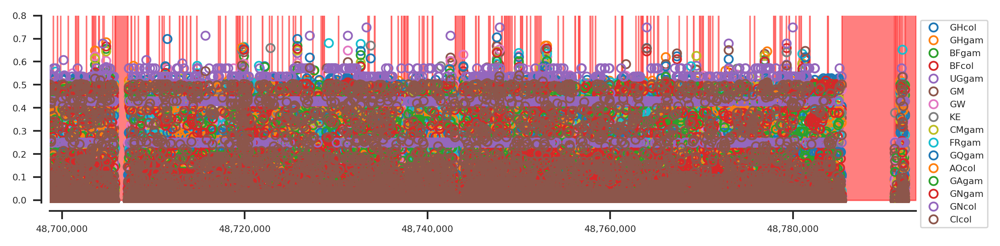

In [22]:
def plot_diversity_raw(xlim=dsx_region[1:], pops=populations, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(9, 2))
    sns.despine(ax=ax, offset=5)
    
    # plot diversity
    x = pos_dsx
    for pop in pops:
        ac = ac_dsx_pops[pop]
        y = allel.mean_pairwise_difference(ac)
        ax.plot(x, y, linestyle=' ', marker='o', mfc='none', label=pop)
    ax.legend(bbox_to_anchor=(1, 1), loc='upper left')
        
    # plot accessibility
    x = np.arange(xlim[0], xlim[1])
    y = 1 - is_accessible[xlim[0] - 1:xlim[1] - 1].astype('u1')
    ax.fill_between(x, 0, y, color='r', alpha=.5)
    
    # tidy up
    ax.set_xlim(*xlim)
    ax.set_ylim(-0.01, 0.8)
    ax.set_xticklabels(['{:,}'.format(int(v)) for v in ax.get_xticks()])
    
plot_diversity_raw()

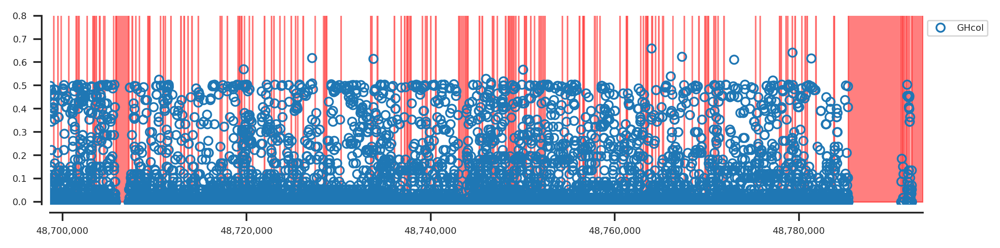

In [23]:
plot_diversity_raw(pops=['GHcol'])

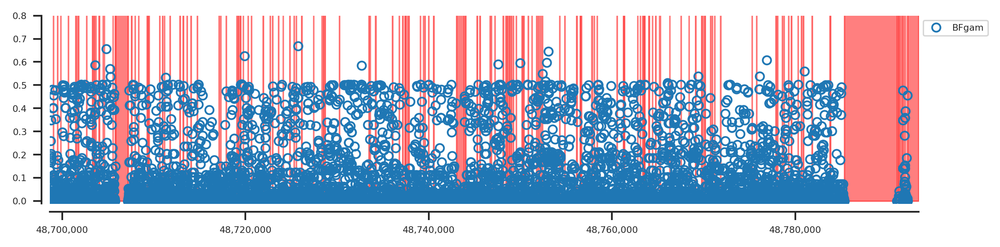

In [24]:
plot_diversity_raw(pops=['BFgam'])

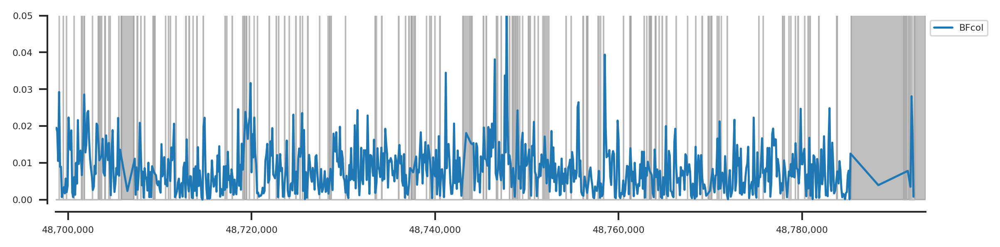

In [25]:
def plot_diversity_windowed(xlim=dsx_region[1:], pops=populations, window_size=100, window_step=None, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(9, 2))
    sns.despine(ax=ax, offset=5)
    
    # plot diversity
    windows = allel.equally_accessible_windows(is_accessible, size=window_size, start=xlim[0], stop=xlim[1], step=window_step)
    x = windows.mean(axis=1)
    for pop in pops:
        ac = ac_dsx_pops[pop]
        mpd = allel.mean_pairwise_difference(ac)
        y, _, _ = allel.windowed_statistic(pos_dsx, mpd, statistic=lambda v: np.sum(v) / window_size, windows=windows, fill=0)
        ax.plot(x, y, linestyle='-', marker=None, label=pop)
    ax.legend(bbox_to_anchor=(1, 1), loc='upper left')
        
    # plot accessibility
    x = np.arange(xlim[0], xlim[1])
    y = 1 - is_accessible[xlim[0] - 1:xlim[1] - 1].astype('u1')
    ax.fill_between(x, 0, y, color='grey', alpha=.5)
    
    # tidy up
    ax.set_xlim(*xlim)
    ax.set_ylim(-0.001, 0.05)
    ax.set_xticklabels(['{:,}'.format(int(v)) for v in ax.get_xticks()])
    
plot_diversity_windowed(pops=['BFcol'])

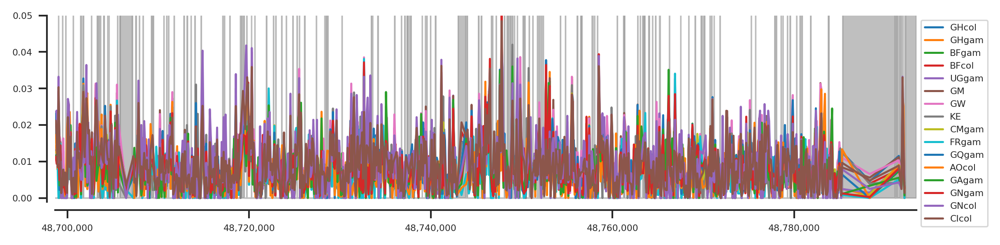

In [26]:
plot_diversity_windowed()

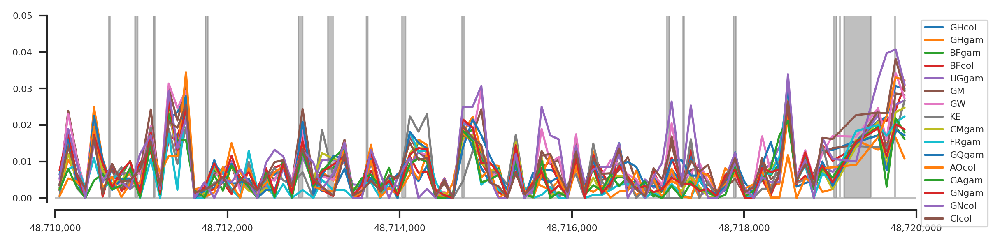

In [27]:
plot_diversity_windowed(xlim=(48_710_000, 48_720_000))

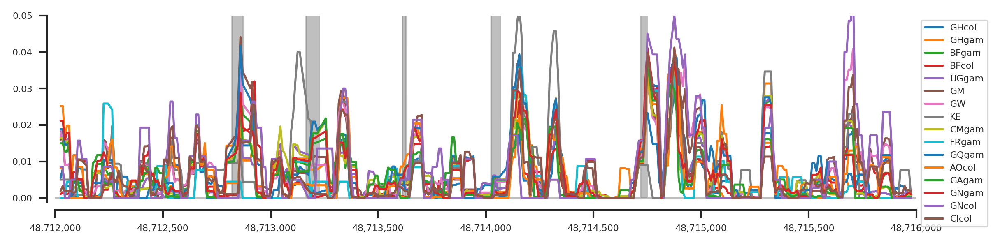

In [28]:
plot_diversity_windowed(xlim=(48_712_000, 48_716_000), window_size=50, window_step=10)

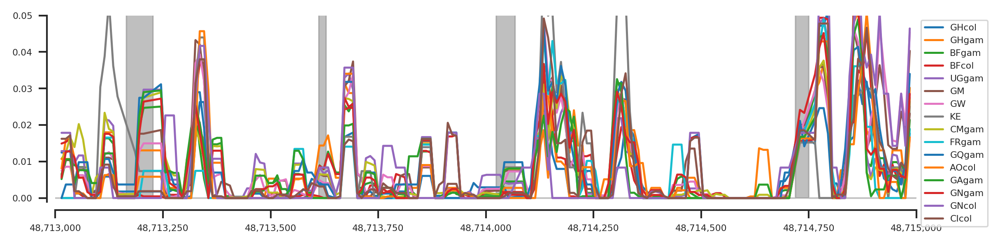

In [29]:
plot_diversity_windowed(xlim=(48_713_000, 48_715_000), window_size=30, window_step=10)

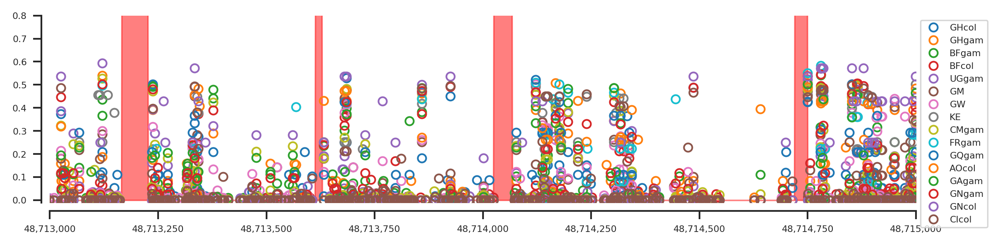

In [30]:
plot_diversity_raw(xlim=(48_713_000, 48_715_000))

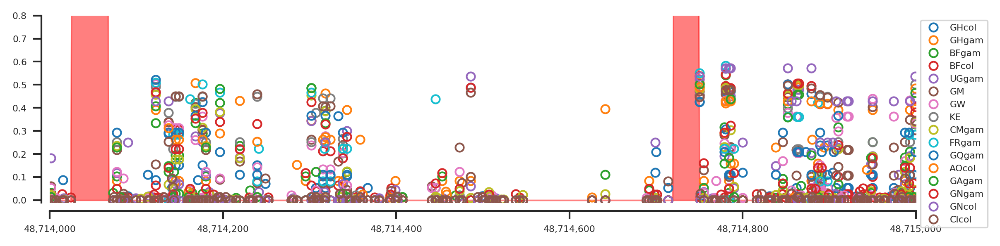

In [31]:
plot_diversity_raw(xlim=(48_714_000, 48_715_000))

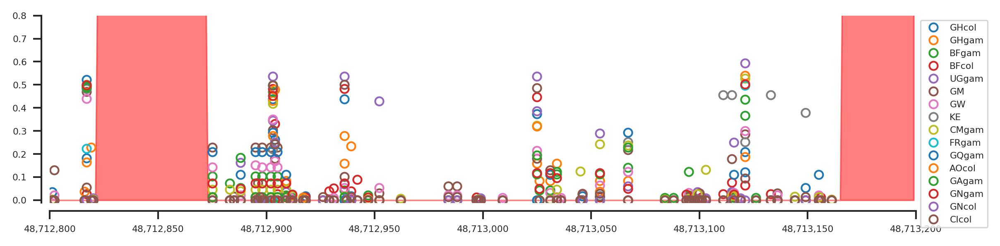

In [32]:
plot_diversity_raw(xlim=(48_712_800, 48_713_200))

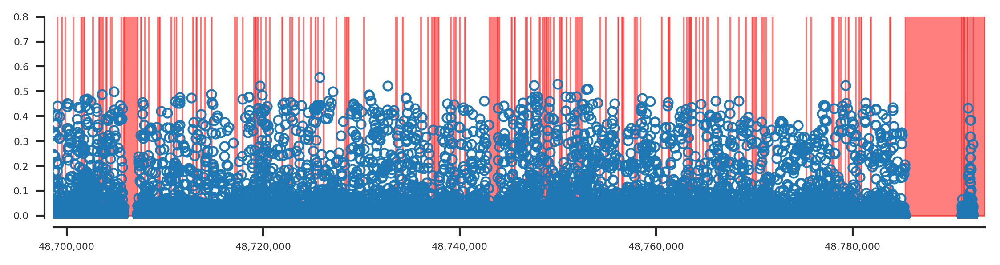

In [35]:
def plot_diversity_raw_mean(xlim=dsx_region[1:], pops=populations, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(9, 2))
    sns.despine(ax=ax, offset=5)
    
    # plot diversity
    x = pos_dsx
    ys = np.vstack([allel.mean_pairwise_difference(ac_dsx_pops[pop]) for pop in populations])
    y = np.mean(ys, axis=0)
    ax.plot(x, y, linestyle=' ', marker='o', mfc='none')
#    ax.legend(bbox_to_anchor=(1, 1), loc='upper left')
        
    # plot accessibility
    x = np.arange(xlim[0], xlim[1])
    y = 1 - is_accessible[xlim[0] - 1:xlim[1] - 1].astype('u1')
    ax.fill_between(x, 0, y, color='r', alpha=.5)
    
    # tidy up
    ax.set_xlim(*xlim)
    ax.set_ylim(-0.01, 0.8)
    ax.set_xticklabels(['{:,}'.format(int(v)) for v in ax.get_xticks()])
    
plot_diversity_raw_mean()

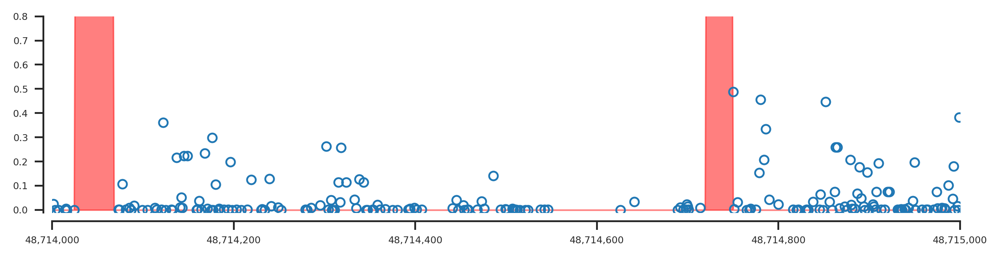

In [36]:
plot_diversity_raw_mean(xlim=(48_714_000, 48_715_000))

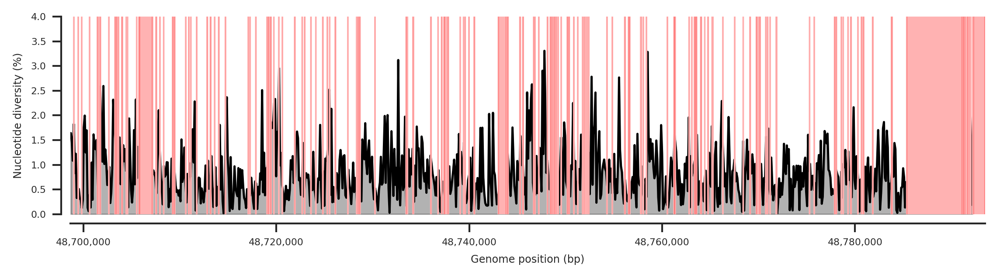

In [18]:
def plot_diversity_windowed_mean(xlim=dsx_region[1:], ylim=(0, 4), pops=populations, window_size=100, window_step=None, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(9, 2))
        sns.despine(ax=ax, offset=5)
    
    # plot diversity
    windows = allel.equally_accessible_windows(is_accessible, size=window_size, start=xlim[0], stop=xlim[1], step=window_step)
    x = windows.mean(axis=1)
    mpds = np.vstack([allel.mean_pairwise_difference(ac_dsx_pops[pop]) for pop in populations])
    mpd = np.mean(mpds, axis=0)
    y, _, _ = allel.windowed_statistic(pos_dsx, mpd, statistic=lambda v: np.sum(v) / window_size, windows=windows, fill=0)
    ax.fill_between(x, 0, y * 100, color='k', alpha=.3)
    ax.plot(x, y * 100, linestyle='-', marker=None, color='k')
    ax.set_ylabel('Nucleotide diversity (%)')
    ax.set_xlabel('Genome position (bp)')
        
    # plot accessibility
    x = np.arange(xlim[0], xlim[1])
    y = (1 - is_accessible[xlim[0]-1:xlim[1]-1].astype('i1')) * 100
    y[y == 0] = -10
    ax.fill_between(x, -100, y, color='w', alpha=1, zorder=10)
#     y[y < 0] = 0
    ax.fill_between(x, -100, y, color='r', alpha=.3, zorder=20)
    
    # tidy up
    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    ax.set_xticklabels(['{:,}'.format(int(v)) for v in ax.get_xticks()])
    
plot_diversity_windowed_mean()

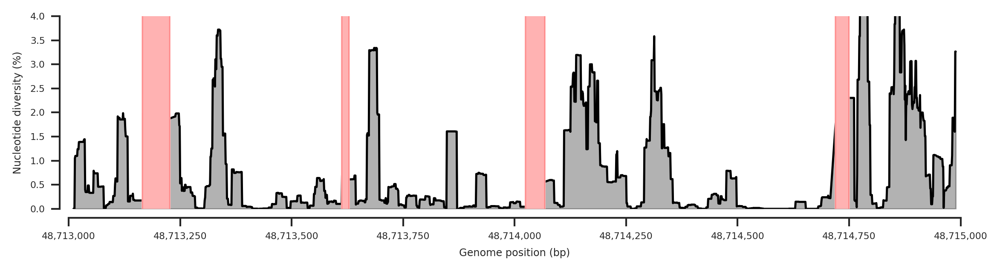

In [38]:
plot_diversity_windowed_mean(xlim=(48_713_000, 48_715_000), window_size=23, window_step=1)

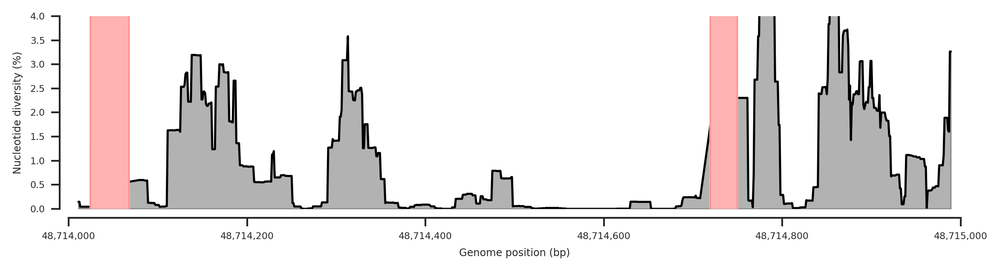

In [39]:
plot_diversity_windowed_mean(xlim=(48_714_000, 48_715_000), window_size=23, window_step=1)

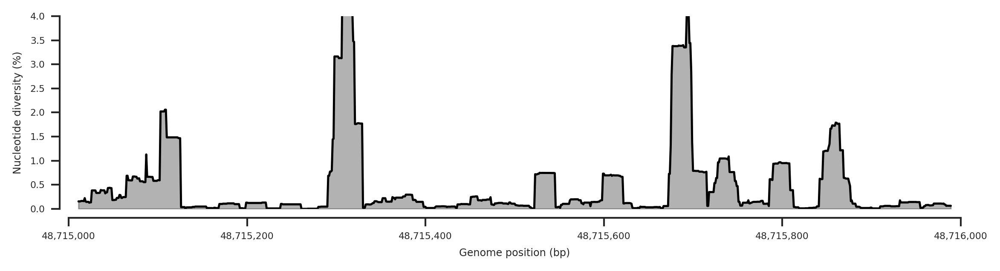

In [40]:
plot_diversity_windowed_mean(xlim=(48_715_000, 48_716_000), window_size=23, window_step=1)

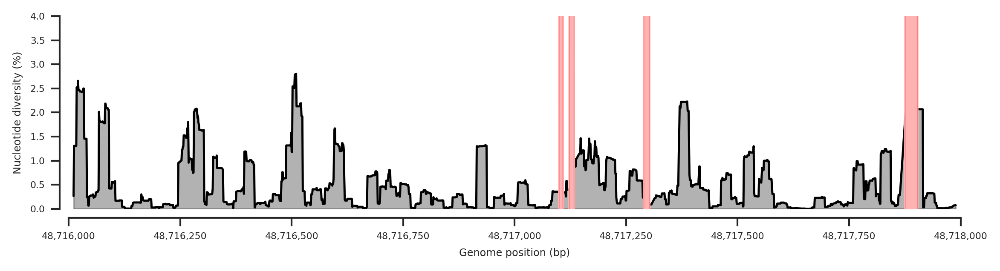

In [41]:
plot_diversity_windowed_mean(xlim=(48_716_000, 48_718_000), window_size=23, window_step=1)

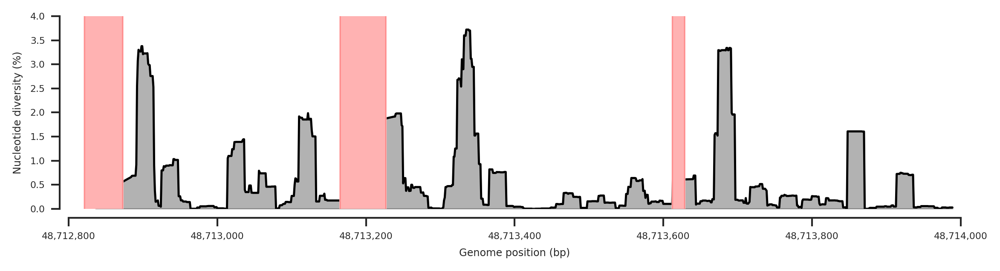

In [42]:
plot_diversity_windowed_mean(xlim=(48_712_800, 48_714_000), window_size=23, window_step=1)

### Setup gene model plotting

In [19]:
features_path = '/kwiat/vector/ag1000g/release/phase2.AR1/geneset/Anopheles-gambiae-PEST_BASEFEATURES_AgamP4.12.gff3.gz'
features_df = allel.gff3_to_dataframe(features_path, attributes=['ID', 'Parent'])
features_df.head()

,seqid,source,type,start,end,score,strand,phase,ID,Parent
0,2L,VectorBase,chromosome,1,49364325,-1,.,-1,2L,.
1,2L,VectorBase,gene,157348,186936,-1,-,-1,AGAP004677,.
2,2L,VectorBase,mRNA,157348,181305,-1,-,-1,AGAP004677-RA,AGAP004677
3,2L,VectorBase,three_prime_UTR,157348,157495,-1,-,-1,.,AGAP004677-RA
4,2L,VectorBase,exon,157348,157623,-1,-,-1,.,AGAP004677-RA


In [20]:
gene_id = 'AGAP004050'
transcript_ids = 'AGAP004050-RA', 'AGAP004050-RB'
features_dsx_df = features_df.loc[(features_df.ID == gene_id) |
                                  (features_df.ID.isin(transcript_ids)) |
                                  (features_df.Parent.isin(transcript_ids))]
features_dsx_df

,seqid,source,type,start,end,score,strand,phase,ID,Parent
92564,2R,VectorBase,gene,48703664,48788460,-1,-,-1,AGAP004050,.
92565,2R,VectorBase,mRNA,48703664,48788460,-1,-,-1,AGAP004050-RA,AGAP004050
92566,2R,VectorBase,exon,48703664,48706331,-1,-,-1,.,AGAP004050-RA
92567,2R,VectorBase,three_prime_UTR,48703664,48706331,-1,-,-1,.,AGAP004050-RA
92568,2R,VectorBase,three_prime_UTR,48711528,48711598,-1,-,-1,.,AGAP004050-RA
92569,2R,VectorBase,exon,48711528,48712794,-1,-,-1,.,AGAP004050-RA
92570,2R,VectorBase,CDS,48711599,48712794,-1,-,2,AGAP004050-PA,AGAP004050-RA
92571,2R,VectorBase,exon,48715161,48715295,-1,-,-1,.,AGAP004050-RA
92572,2R,VectorBase,CDS,48715161,48715295,-1,-,2,AGAP004050-PA,AGAP004050-RA
92573,2R,VectorBase,exon,48747693,48747737,-1,-,-1,.,AGAP004050-RA


In [21]:
def plot_transcripts(geneset, height=.5, label_transcripts=True, label_exons=False, label_exon_size=False,
                     label_codons=False, highlight_exons=None, label_cdss=False, highlight_color='red', ax=None,
                     title=None, xlim=None, exon_label='{}', include_transcripts=None):
    """Plot all transcripts for all genes overlapping a given region."""

    if ax is None:
        fig, ax = plt.subplots(figsize=(9, 1))
    sns.despine(ax=ax, left=True, bottom=True)
        
    if title:
        ax.set_title(title, va='bottom')

    # find genes overlapping the given region 
    genes = geneset.query("(type == 'gene')").sort_values('start')

    # iterate over genes
    for _, gene in genes.iterrows():

        # find child transcripts
        transcripts = geneset.query("(type == 'mRNA') and (Parent == %r)" % gene.ID).sort_values('ID')

        # iterate over transcripts
        for i, (_, transcript) in enumerate(transcripts.iterrows()):
            if include_transcripts is not None and transcript.ID not in include_transcripts:
                continue
            
            # coordinates for plotting the transcript
            if transcript.strand == '+':
                y = i
            else:
                y = -i - 1

            # annotate with transcript ID
            if xlim is not None:
                start, stop = xlim
                text_y = y + height + (height / 10)
                if label_transcripts == 'right':
                    text_x = min(stop, transcript.end)
                    ha = 'right'
                else:
                    text_x = max(start, transcript.start)
                    ha = 'left'
                if label_transcripts:
                    if transcript.strand == '+':
                        text = '%s >' % transcript.ID
                    else:
                        text = '< %s' % transcript.ID
                    ax.text(text_x, text_y, text, ha=ha, va='bottom')
            
            # find child exons
            exons = geneset.query("type == 'exon' and Parent == %r" % transcript.ID).sort_values('start')
            
            # iterate over exons to plot introns
            last_exon = None
            for i, (_, exon) in enumerate(exons.iterrows()):
                x = exon.start
                width = exon.end - x

                # plot intron
                if last_exon is not None:
                    ax.plot([last_exon.end, (last_exon.end + exon.start) / 2, exon.start], [y + height / 2, y + height / 1.5, y + height / 2], 'k-')
                last_exon = exon
                
                # exon number
                n = i + 1 if exon.strand == '+' else len(exons) - i
                
#                 # label exons
#                 if label_exons and exon.end > start and exon.start < stop:
#                     text_x = (exon.start + exon.end) / 2
#                     ha = 'center'
#                     if text_x < start:
#                         text_x = start
#                         ha = 'left'
#                     elif text_x > stop:
#                         text_x = stop
#                         ha = 'right'
#                     s = str(n)
#                     if label_exon_size:
#                         s += ' (%s)' % (exon.end - exon.start + 1)
#                     if label_exons == 'center':
#                         ax.text(text_x, y + height / 2, s, ha=ha, va='center', color='w', zorder=20, fontweight='bold')
#                     else:
#                         ax.text(text_x, text_y, s, ha=ha, va='bottom', color='k', zorder=20)
                
#                 # highlight exons
#                 if highlight_exons and (transcript.ID, n) in highlight_exons:
#                     patch = plt.Rectangle((x, y), width, height, color=highlight_color, alpha=1, zorder=10)
#                     ax.add_patch(patch)

            # find child CDSs
            cdss = geneset.query("type == 'CDS' and Parent == %r" % transcript.ID)
            if transcript.strand == '+':
                cdss = cdss.sort_values('start', ascending=True)
            else:
                cdss = cdss.sort_values('end', ascending=False)
                
            # keep track of CDS position
            cds_pos = 0
            
            # plot CDSs
            for _, cds in cdss.iterrows():
                x = cds.start
                width = cds.end - x
                
                # plot CDS
                patch = plt.Rectangle((x, y), width, height, color='k')
                ax.add_patch(patch)
                
#                 if label_codons:
#                     # report 1-based numbers
#                     s = '%s (%s)' % ((cds_pos // 3) + 1, cds_pos + 1)
#                     if transcript.strand == '+':
#                         text_x = x
#                         ha = 'left'
#                     else:
#                         text_x = x + width
#                         ha = 'right'
#                     if text_x > start and text_x < stop:
#                         ax.text(text_x, text_y, s, ha=ha, va='bottom')
                        
#                 # label CDSs
#                 if label_cdss and cds.end > start and cds.start < stop:
#                     text_x = (cds.start + cds.end) / 2
#                     ha = 'center'
#                     if text_x < start:
#                         text_x = start
#                         ha = 'left'
#                     elif text_x > stop:
#                         text_x = stop
#                         ha = 'right'
#                     s = cds.ID
#                     if label_cdss == 'center':
#                         ax.text(text_x, y + height / 2, s, ha=ha, va='center', color='w', zorder=20, fontweight='bold')
#                     else:
#                         ax.text(text_x, text_y, s, ha=ha, va='bottom', color='k', zorder=20)
                
                # accumulate CDS positions
                cds_pos += width + 1  # N.B., GFF coords are 1-based end-inclusive

            # find child UTRs
            utrs = geneset.query("(type == 'three_prime_UTR' or type == 'five_prime_UTR') and Parent == %r" % transcript.ID).sort_values('start')
            for _, utr in utrs.iterrows():
                x = utr.start
                width = utr.end - x
                utr_height = height# * .8
                utr_y = y + (height - utr_height) / 2
                patch = plt.Rectangle((x, utr_y), width, utr_height, color='#cccccc')
                ax.add_patch(patch)

            # plot exons
            if transcript.strand == '+':
                exons = exons.sort_values('start', ascending=True)
            else:
                exons = exons.sort_values('end', ascending=False)
            for i, (_, exon) in enumerate(exons.iterrows()):
                x = exon.start
                width = exon.end - x
                exon_height = height# * .8
                exon_y = y + (height - exon_height) / 2
                patch = plt.Rectangle((x, exon_y), width, exon_height, facecolor='none', edgecolor='k', linewidth=1)
                ax.add_patch(patch)

                # label exons
                if label_exons == transcript.ID and xlim is not None:
#                     text_y = y - height/10
                    text_y = y + height/2
                    start, stop = xlim
                    if exon.end > start and exon.start < stop:
                        if exon.start < start:
                            text_x = (start + exon.end) / 2
                        elif exon.end > stop:
                            text_x = (exon.start + stop) / 2
                        else:
                            text_x = (exon.start + exon.end) / 2
                        s = exon_label.format(i + 1)
                        ax.text(text_x, text_y, s, ha='center', va='center', color='k', zorder=20)

    ax.set_yticks([])
    if xlim:
        ax.set_xlim(*xlim)
    ax.set_xticks([])
#     ax.set_xticklabels(['{:,}'.format(int(x)) for x in ax.get_xticks()])
#     ax.axhline(0 - (height / 2), color='k', linestyle='--')
#     ax.set_xlabel('Chromosome %s position (bp)' % chrom)
    ax.autoscale(axis='y', tight=False)


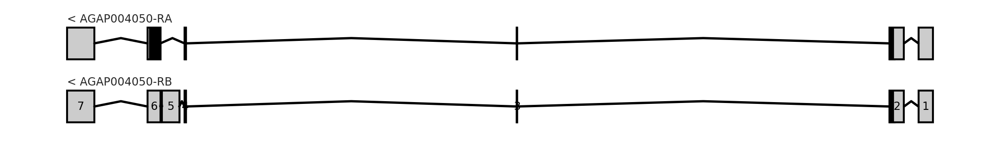

In [22]:
plot_transcripts(features_dsx_df, xlim=dsx_region[1:], label_exons='AGAP004050-RB')

## Further exploration with gene model

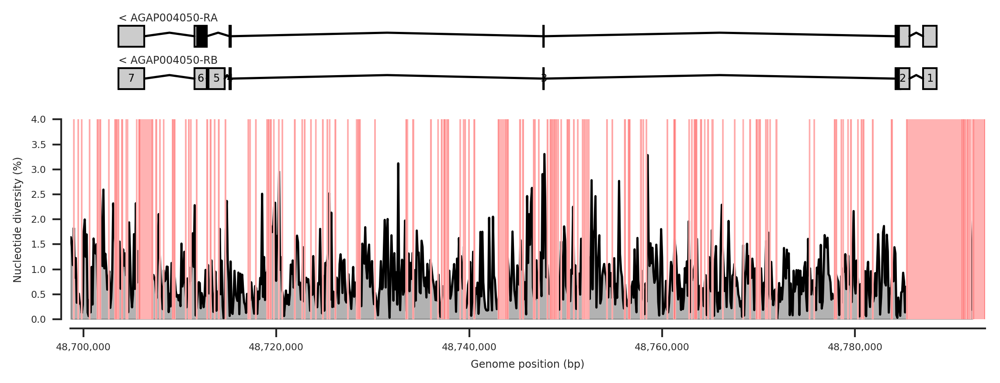

In [23]:
def fig_diversity_windowed_mean(xlim=dsx_region[1:], ylim=(0, 4), pops=populations, window_size=100, window_step=None,
                                figsize=(9, 3), exon_label='{}'):
    gs = plt.GridSpec(nrows=2, ncols=1, height_ratios=(.7, 2))
    
    fig = plt.figure(figsize=figsize)
    
    # plot the gene model
    ax = fig.add_subplot(gs[0])
    plot_transcripts(features_dsx_df, ax=ax, xlim=xlim, label_exons='AGAP004050-RB', exon_label=exon_label)
    ax.set_xlim(*xlim)
    
    # plot diversity
    ax = fig.add_subplot(gs[1])
    sns.despine(ax=ax, offset=5)
    plot_diversity_windowed_mean(xlim=xlim, ylim=ylim, pops=pops, window_size=window_size, window_step=window_step, ax=ax)
    ax.set_xlim(*xlim)

    
fig_diversity_windowed_mean()

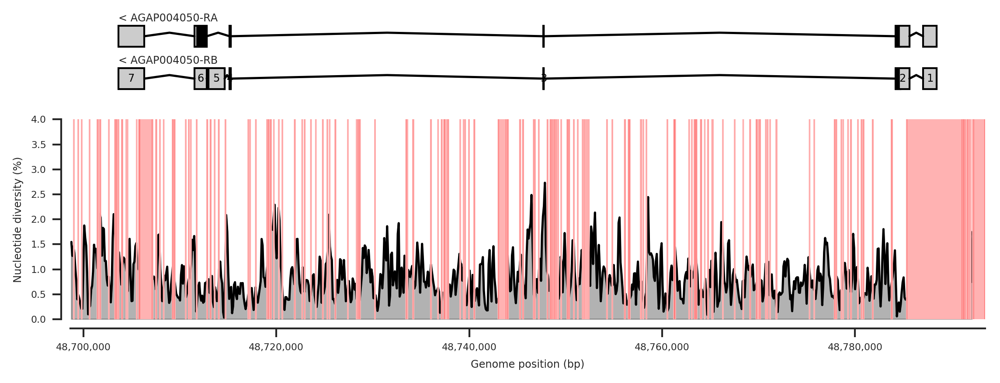

In [50]:
fig_diversity_windowed_mean(window_size=200, window_step=100)

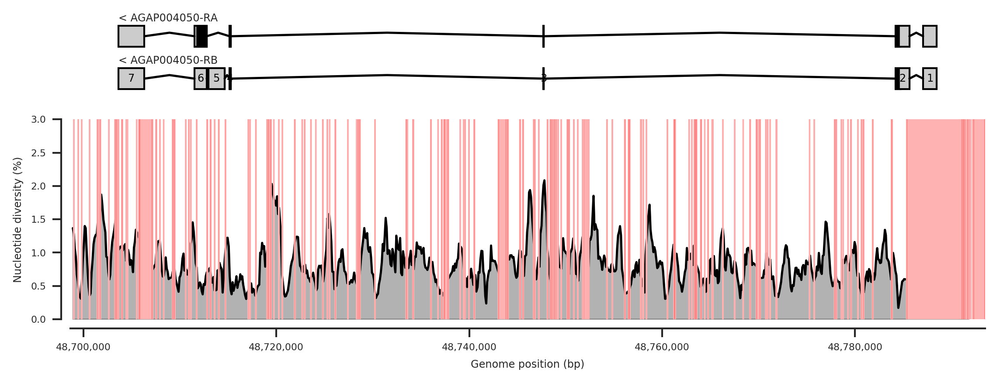

In [53]:
fig_diversity_windowed_mean(window_size=500, window_step=100, ylim=(0, 3))

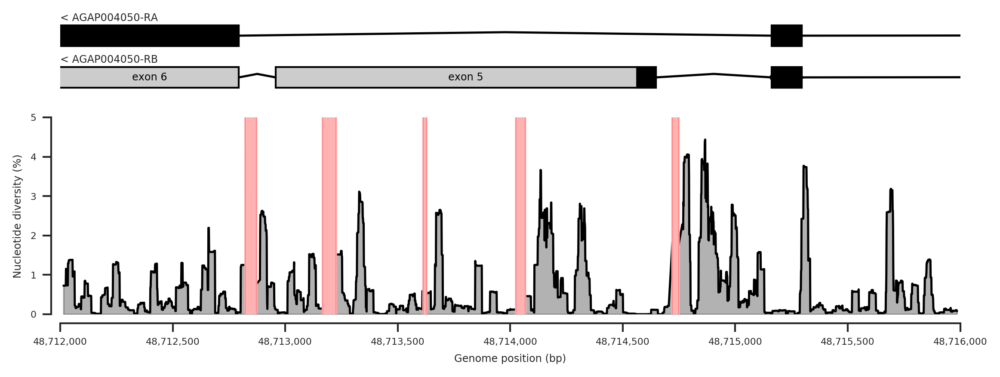

In [54]:
fig_diversity_windowed_mean(xlim=(48_712_000, 48_716_000), window_size=30, window_step=1, exon_label='exon {}', ylim=(0, 5))

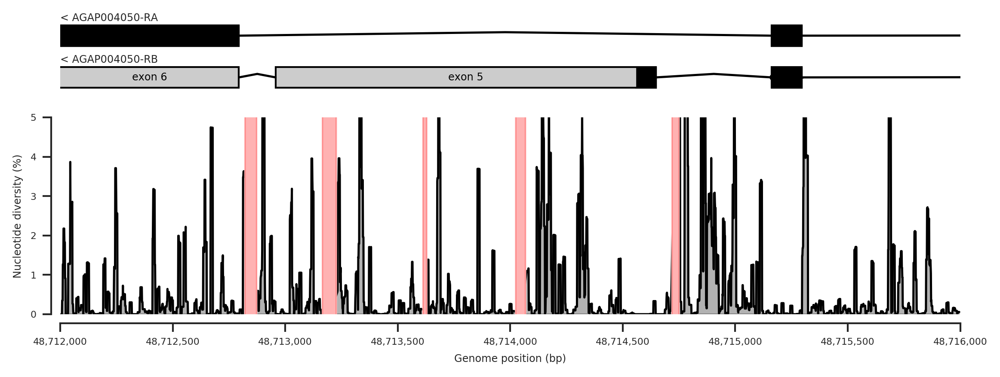

In [55]:
fig_diversity_windowed_mean(xlim=(48_712_000, 48_716_000), window_size=10, window_step=1, exon_label='exon {}', ylim=(0, 5))

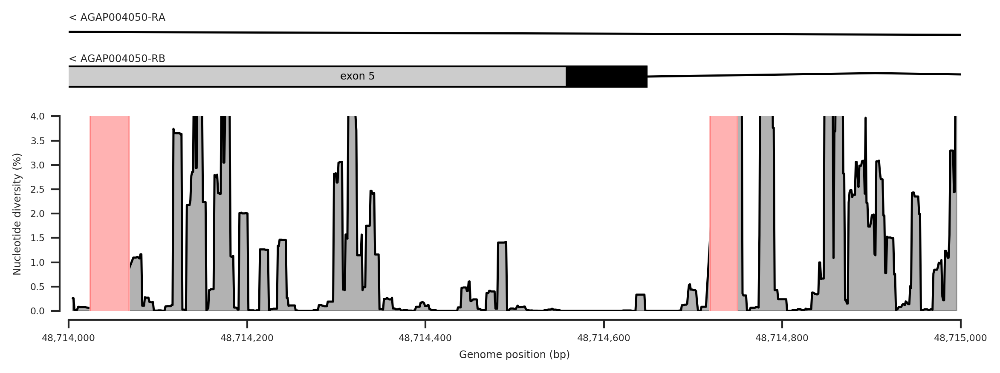

In [56]:
fig_diversity_windowed_mean(xlim=(48_714_000, 48_715_000), window_size=10, window_step=1, exon_label='exon {}')

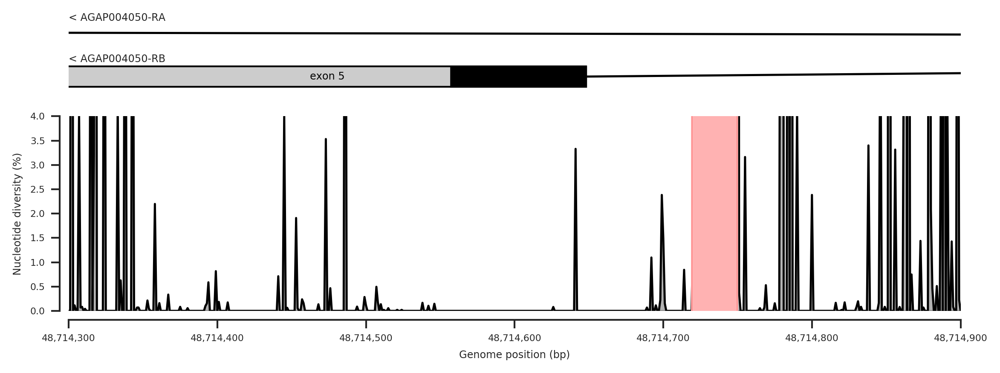

In [57]:
fig_diversity_windowed_mean(xlim=(48_714_300, 48_714_900), window_size=1, window_step=1, exon_label='exon {}')

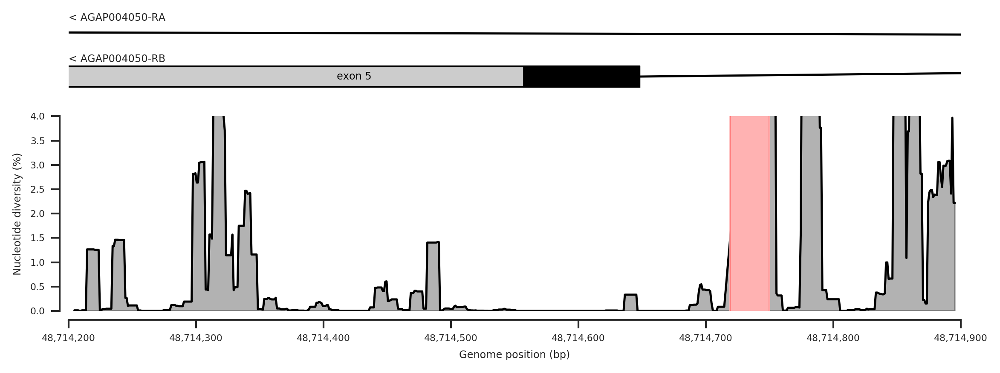

In [58]:
fig_diversity_windowed_mean(xlim=(48_714_200, 48_714_900), window_size=10, window_step=1, exon_label='exon {}')

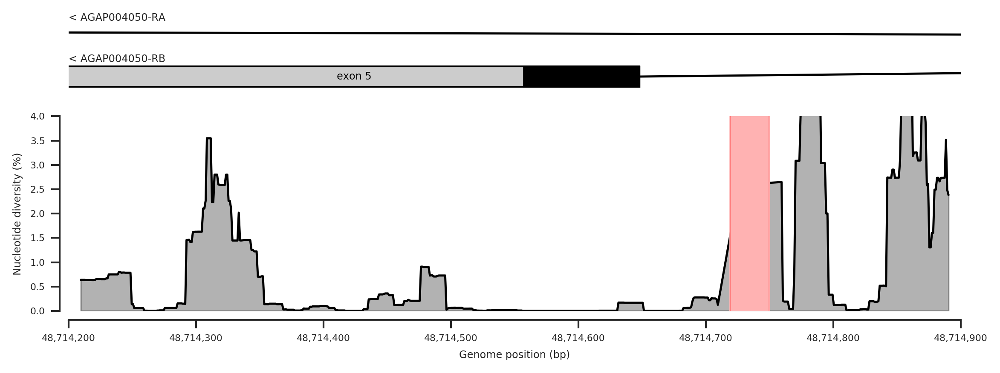

In [59]:
fig_diversity_windowed_mean(xlim=(48_714_200, 48_714_900), window_size=20, window_step=1, exon_label='exon {}')

## Find dsxREs from https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1350936/

In [24]:
exon_5_start = 48_712_957
exon_5_end = 48_714_648
import pyfasta
genome = pyfasta.Fasta('/kwiat/vector/ag1000g/release/phase2.AR1/genome/agamP4/Anopheles-gambiae-PEST_CHROMOSOMES_AgamP4.fa')
genome

In [25]:
seq = np.asarray(genome['2R'])
seq

array([b'C', b'T', b'c', ..., b'A', b'C', b'A'], dtype='|S1')

In [26]:
re1 = exon_5_start + 544
re1_alt = exon_5_end - 1176
re1, re1_alt

(48713501, 48713472)

N.B., the numbers above don't match, which means something must have changed in the genome sequence and/or gene model since https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1350936/

Need to go searching...

In [27]:
from Bio.Seq import Seq

In [28]:
exon5_seq = Seq(seq[exon_5_start-1:exon_5_end-1].tostring().decode()).upper()
exon5_seq

Seq('CTTCTGCACAGATTGATTGATTGTAGAGTGGAGTGGAAAGTGGTCTGCTCTAGA...TGA')

In [29]:
exon5_transcript = exon5_seq.reverse_complement().transcribe()
exon5_transcript

Seq('UCAAGCGGUGGUCAACGAAUACUCACGAUUGCAUAAUCUGAACAUGUUUGAUGG...AAG', RNAAlphabet())

Find dsxREs from https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1350936/ ...

In [30]:
# bp to 3' splice: 1176; bp to 5' splice: 544
# UCgcCgAUCAACc - not perfect match
exon5_transcript[1189:1189+13]

Seq('UCACCAAUCAACC', RNAAlphabet())

In [31]:
# bp to 3' splice: 1197; bp to 5' splice: 523
# cCAUCguUCAACc
exon5_transcript[1208:1208+13]

Seq('CCAUCGUUCAACC', RNAAlphabet())

In [32]:
# bp to 3' splice: 1220; bp to 5' splice: 500
# UCAACA-UCAuCg - not perfect match
exon5_transcript[1231:1231+13]

Seq('UCAACAUCGUCAU', RNAAlphabet())

In [33]:
# bp to 3' splice: 1343; bp to 5' splice: 377
# UCUcCAAUCAAuc - not perfect match
exon5_transcript[1349:1349+13]

Seq('UCUCCAAUCAAAA', RNAAlphabet())

In [34]:
# bp to 3' splice: 1606; bp to 5' splice: 114
# aCAUCAAUCAAuA - not perfect match
exon5_transcript[1580:1580+13]

Seq('ACAUCAAUCAAAA', RNAAlphabet())

In [35]:
# bp to 3' splice: 1694; bp to 5' splice: 26
# aCAUCAAUCAAuc - not perfect match
exon5_transcript[1668:1668+13]

Seq('CAAUCAAUCAAUC', RNAAlphabet())

In [36]:
re_transcript_starts = 1189, 1208, 1231, 1349, 1580, 1668

In [37]:
re_genome_starts = sorted([exon_5_end - s - 13 for s in re_transcript_starts])
re_genome_starts

[48712967, 48713055, 48713286, 48713404, 48713427, 48713446]

In [38]:
for x in re_genome_starts:
    print(x, Seq(seq[x-1:x+13-1].tostring().decode()).upper().reverse_complement().transcribe())

48712967 CAAUCAAUCAAUC
48713055 ACAUCAAUCAAAA
48713286 UCUCCAAUCAAAA
48713404 UCAACAUCGUCAU
48713427 CCAUCGUUCAACC
48713446 UCACCAAUCAACC


In [39]:
dmdsx_re_cmp = 'U', 'C', 'UA', 'UA', 'C', 'A', 'A', 'U', 'C', 'A', 'A', 'C', 'A'


def find_seq(start, extent, cmp=dmdsx_re_cmp, min_score=9):
    l = len(cmp)
    match_starts = []
    for i in range(start, start + extent):
        s = seq[i - 1:i + l - 1].tostring().decode()
        s = Seq(s).reverse_complement().transcribe()
        score = 0
        match = []
        for x, t in zip(s, cmp):
            if x in t:
                score += 1
                match.append(x)
            else:
                match.append(x.lower())
        if score >= min_score:
            print(i, ''.join(match), score)
            match_starts.append(i)
    return match_starts


dsxre_match_starts = find_seq(48_712_900, 1700)
print('--- compare ---')
for x in re_genome_starts:
    print(x, Seq(seq[x-1:x+13-1].tostring().decode()).upper().reverse_complement().transcribe())

48712967 caAUCAAUCAAuc 9
48712971 UCUACAAUCAAuc 11
48712978 aCUcCAcUCuACA 9
48713048 UCAAaAAgaAAaA 9
48713055 aCAUCAAUCAAaA 11
48713286 UCUcCAAUCAAaA 11
48713370 UuAAaAAUgAACc 9
48713411 aCcUgAgUCAACA 9
48713423 cgUUCAAcCAAuA 9
48713427 cCAUCguUCAACc 9
48713446 UCAcCAAUCAACc 11
48714453 UuUUaAAUCAAgc 9
--- compare ---
48712967 CAAUCAAUCAAUC
48713055 ACAUCAAUCAAAA
48713286 UCUCCAAUCAAAA
48713404 UCAACAUCGUCAU
48713427 CCAUCGUUCAACC
48713446 UCACCAAUCAACC


## Further plotting

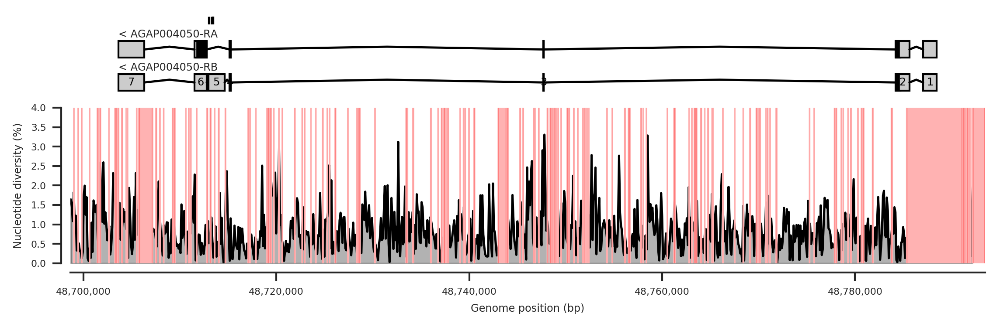

In [40]:
def fig2(xlim=dsx_region[1:], pops=populations, window_size=100, window_step=None,
         figsize=(9, 2.5), exon_label='exon {}', ylim=(0, 4)):
    gs = plt.GridSpec(nrows=3, ncols=1, height_ratios=(.1, .7, 2))
    
    fig = plt.figure(figsize=figsize)
    
    # plot the regulatory sequences
    ax = fig.add_subplot(gs[0])
    ax.set_axis_off()
    for x in re_genome_starts:
        patch = plt.Rectangle((x, 0), 13, 1, color='k')
        ax.add_patch(patch)
    ax.set_xlim(*xlim)
    
    # plot the gene model
    ax = fig.add_subplot(gs[1])
    plot_transcripts(features_dsx_df, ax=ax, xlim=xlim, label_exons='AGAP004050-RB', exon_label=exon_label)
    ax.set_xlim(*xlim)
    
    # plot diversity
    ax = fig.add_subplot(gs[2])
    sns.despine(ax=ax, offset=5)
    plot_diversity_windowed_mean(xlim=xlim, pops=pops, window_size=window_size, 
                                 window_step=window_step, ax=ax, ylim=ylim)
    ax.set_xlim(*xlim)

    
fig2(exon_label='{}')

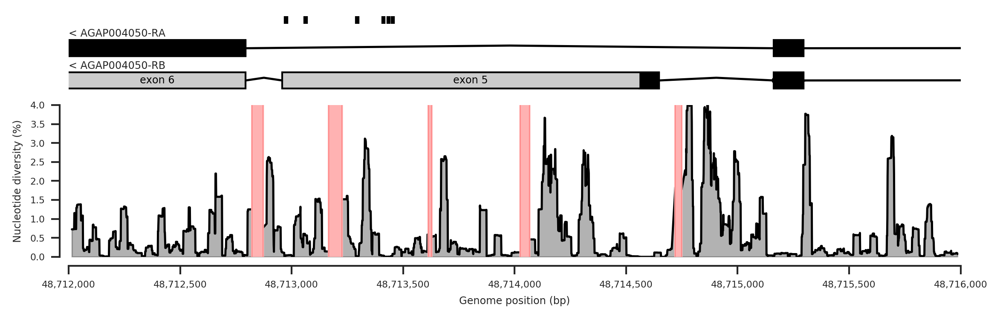

In [41]:
fig2(xlim=(48_712_000, 48_716_000), window_size=30, window_step=1)

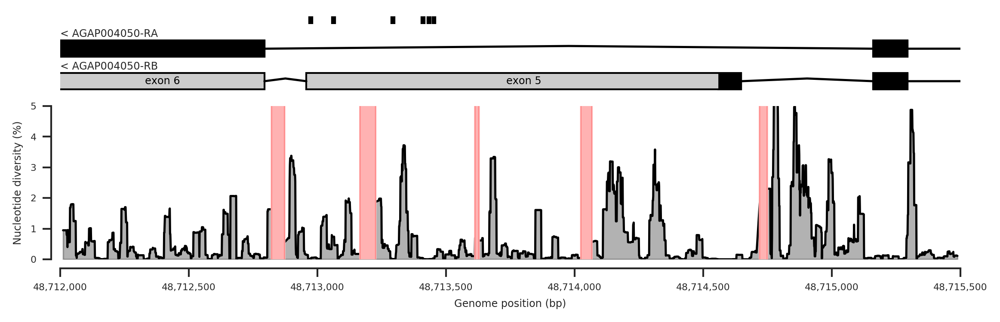

In [81]:
fig2(xlim=(48_712_000, 48_715_500), window_size=23, window_step=1, ylim=(0, 5))

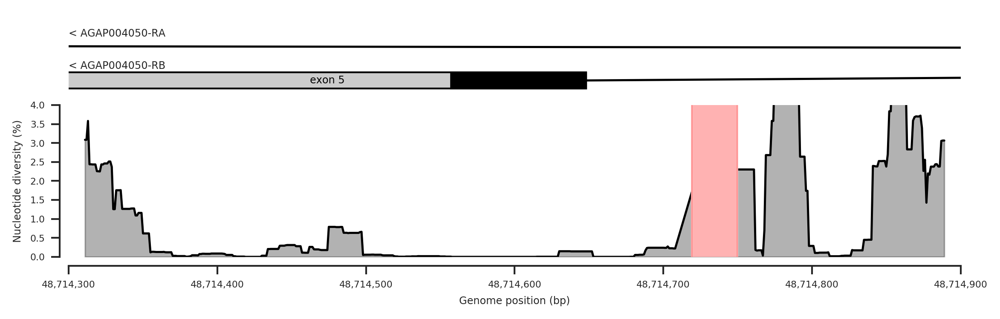

In [82]:
fig2(xlim=(48_714_300, 48_714_900), window_size=23, window_step=1)

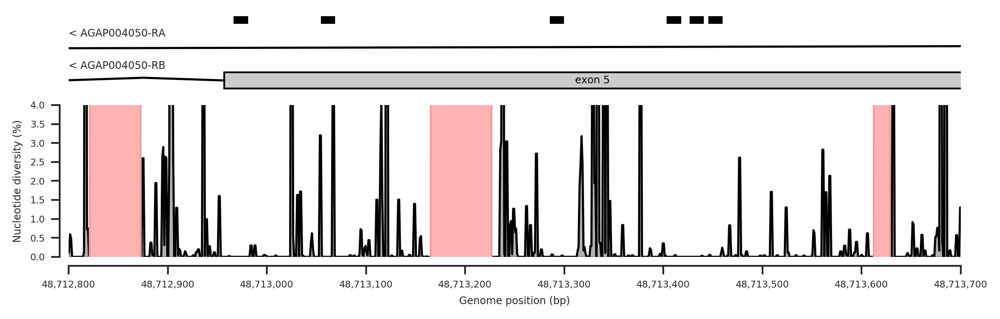

In [83]:
fig2(xlim=(48_712_800, 48_713_700), window_size=2, window_step=1)

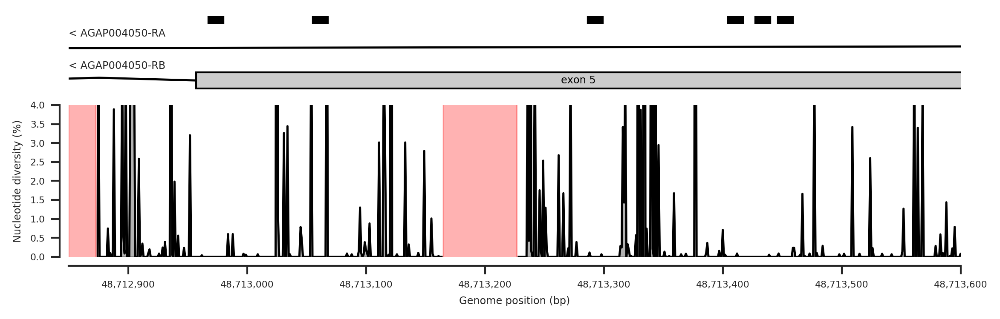

In [84]:
fig2(xlim=(48_712_850, 48_713_600), window_size=1, window_step=1)

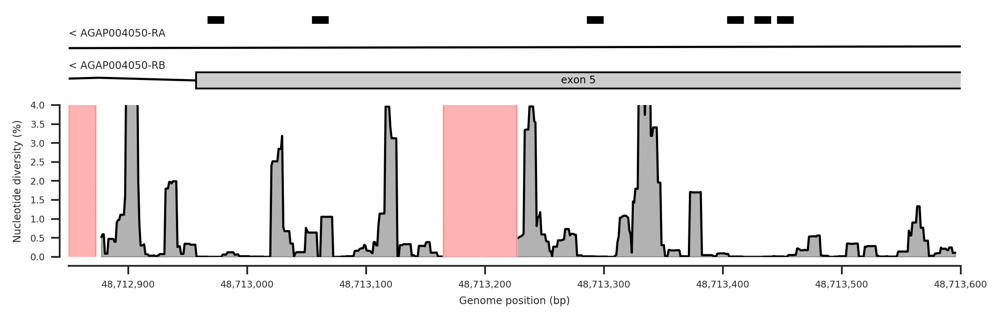

In [85]:
fig2(xlim=(48_712_850, 48_713_600), window_size=10, window_step=1)

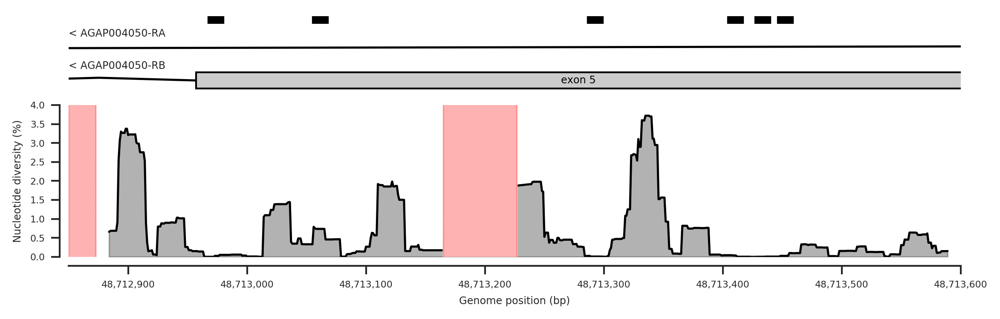

In [86]:
fig2(xlim=(48_712_850, 48_713_600), window_size=23, window_step=1)

## Build final plots

TODO:
* DONE Add a variants track with marker triangles, coloured by pass/fail
* DONE Label the regulatory elements
* DONE Add a patch with the targeted Cas9 region
* DONE Add option to remove the male transcript
* Create multi-part figure:
  * ??? (a) Whole gene, both transcripts, 500 bp windows, no variants
  * DONE (b) Exon 5 5' end, female transcript only, cas9 target marked, variants marked
  * DONE (c) Exon 5 3' end, female transcript only, REs marked, variants marked

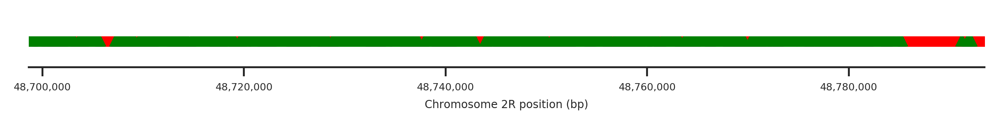

In [42]:
def plot_variants(xlim=dsx_region[1:], pass_color='g', fail_color='r', marker='^', marker_size=None, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(9, .5))
    sns.despine(ax=ax, offset=0, left=True)
    ax.set_yticks([])
    pos_all = allel.SortedIndex(callset_all['2R/variants/POS'][:])
    filter_pass_all = callset_all['2R/variants/FILTER_PASS'][:]
    loc_lim = pos_all.locate_range(*xlim)
    pos_lim = pos_all[loc_lim]
    filter_pass_lim = filter_pass_all[loc_lim]
    ax.plot(pos_lim[~filter_pass_lim], np.repeat(0, (~filter_pass_lim).sum()), marker=marker, linestyle=' ', markerfacecolor=fail_color, mec=fail_color, mew=.5, markersize=marker_size)
    ax.plot(pos_lim[filter_pass_lim], np.repeat(0, filter_pass_lim.sum()), marker=marker, linestyle=' ', markerfacecolor=pass_color, mec=pass_color, mew=.5, markersize=marker_size)
    ax.set_xlim(*xlim)
    ax.set_xticklabels(['{:,}'.format(int(v)) for v in ax.get_xticks()])
    ax.set_xlabel('Chromosome 2R position (bp)')
    ax.set_ylim(-1, 1)

    
plot_variants()

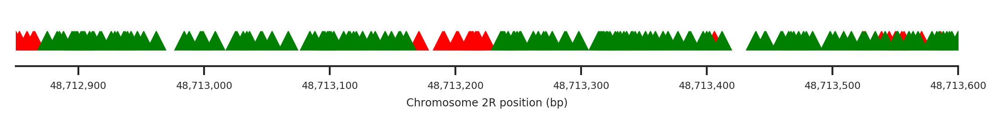

In [43]:
plot_variants(xlim=(48_712_850, 48_713_600), marker_size=10)

In [44]:
dsx_seq = seq[dsx_region[1]-1:dsx_region[2]-1].tostring().decode()
dsx_seq.find('CCACCGCTT')

15973

In [45]:
dsx_seq[15973:15973+23]

'CCACCGCTTGACCTGTGTTAAAC'

In [46]:
kyrou_target_start = dsx_region[1] + 15973

In [47]:
seq[kyrou_target_start-1:kyrou_target_start + 23 - 1].tostring().decode()

'CCACCGCTTGACCTGTGTTAAAC'

In [48]:
def fig3(xlim=dsx_region[1:], pops=populations, window_size=100, window_step=None,
         figsize=(8, 2.4), exon_label='exon {}', diversity_ylim=(0, 4), filename=None, dpi=150):
    gs = plt.GridSpec(nrows=4, ncols=1, height_ratios=(1, 2, 16, 1.5), hspace=.1)
    
    fig = plt.figure(figsize=figsize, dpi=150)
    
    # plot the regulatory sequences & cas9 target
    ax = fig.add_subplot(gs[0])
    ax.set_axis_off()
    for x in re_genome_starts:
        if xlim[0] < x < xlim[1]: 
            patch = plt.Rectangle((x, 0), 13, 1, color='k')
            ax.add_patch(patch)
            ax.text(x + 6.5, 1, 'RE', color='k', ha='center', va='bottom', fontsize='small')
#     last_re_match = None
#     y = 0
#     y_max = 1
#     for x in dsxre_match_starts:
#         if xlim[0] < x < xlim[1]: 
#             if last_re_match is None or x > (last_re_match + 13):
#                 y = 0
#             else:
#                 y += 1
#             y_max = max(y_max, y)
#             patch = plt.Rectangle((x, y), 13, 1, color='k')
#             ax.add_patch(patch)
#             ax.text(x + 6.5, y + 1, 'RE', color='k', ha='center', va='bottom', fontsize='small')
#             last_re_match = x
    if xlim[0] < kyrou_target_start < xlim[1]:
            patch = plt.Rectangle((kyrou_target_start, 0), 23, 1, color='k')
            ax.add_patch(patch)
            ax.text(kyrou_target_start + 11.5, 1, 'Cas9 target', color='k', ha='center', va='bottom', fontsize='small')
    ax.set_xlim(*xlim)
#     ax.set_ylim(0, y_max + 1)
    ax.set_ylim(0, 1)
    
    # plot the gene model
    ax = fig.add_subplot(gs[1])
    plot_transcripts(features_dsx_df, ax=ax, xlim=xlim, label_exons='AGAP004050-RB', exon_label=exon_label, include_transcripts=['AGAP004050-RB'])
    ax.set_xlim(*xlim)
    
    # plot diversity
    ax = fig.add_subplot(gs[2])
    sns.despine(ax=ax, offset=5, bottom=True)
    plot_diversity_windowed_mean(xlim=xlim, pops=pops, window_size=window_size, 
                                 window_step=window_step, ax=ax, ylim=diversity_ylim)
    ax.set_xlim(*xlim)
    ax.set_xticks([])
    ax.set_xlabel('')
    
    # plot variants
    ax = fig.add_subplot(gs[3])
    sns.despine(ax=ax, offset=5)
    plot_variants(xlim=xlim, ax=ax, marker_size=4)
    ax.set_ylabel('SNPs', rotation=0, va='center', ha='right')
    ax.set_xlim(*xlim)

    if filename:
        fig.savefig(filename, bbox_inches='tight', frameon=True, dpi=dpi)

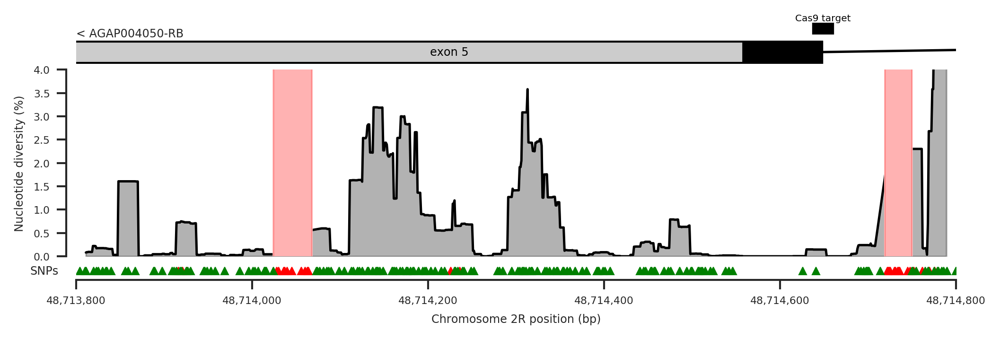

In [49]:
fig3(xlim=(48_713_800, 48_714_800), window_size=23, window_step=1, diversity_ylim=(0, 4), filename='../../artwork/dsx_a.pdf')

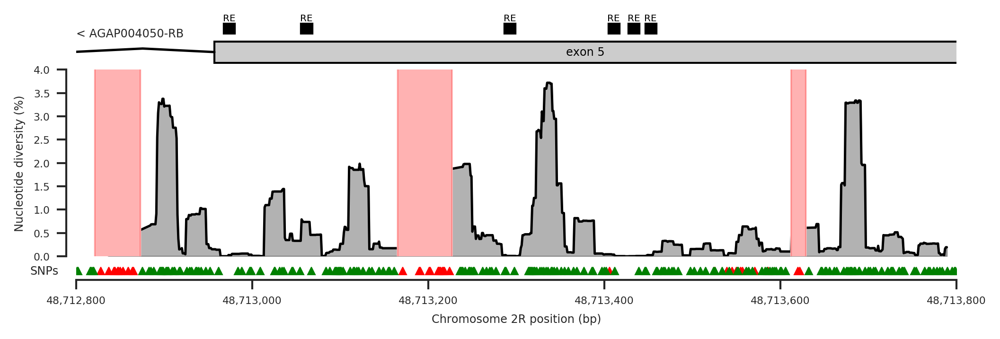

In [50]:
fig3(xlim=(48_712_800, 48_713_800), window_size=23, window_step=1, diversity_ylim=(0, 4), filename='../../artwork/dsx_b.pdf')

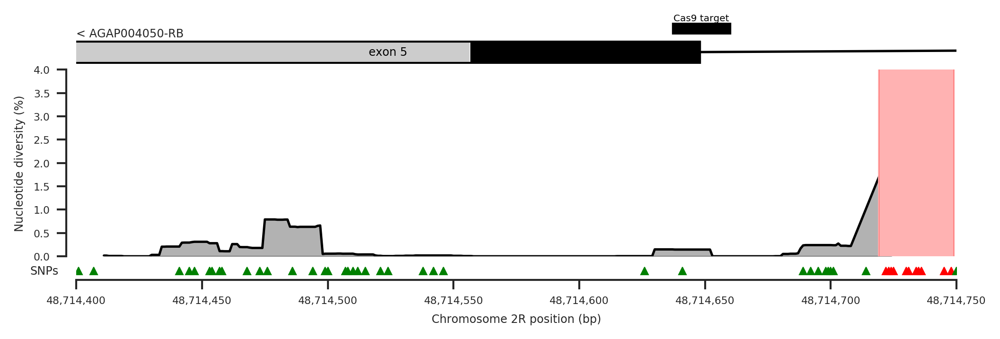

In [55]:
fig3(xlim=(48_714_400, 48_714_750), window_size=23, window_step=1, diversity_ylim=(0, 4))